### Load Magnetotellurics from GDR and save only limited locate data
References: https://gdr.openei.org/submissions/1578

DOI
10.15121/2283064

Utah FORGE: Magnetotelluric (MT) Data from Southwestern Utah

This comprehensive magnetotelluric (MT) dataset, covering southwestern Utah, integrates 600 sites from various surveys, including those from the Utah FORGE, SubTER, and Play Fairway projects, all of which are linked below. The core of this dataset is the use of a 3D finite element (FE) algorithm for inversion imaging, allowing for detailed analysis of the MT data. Here you will find all the .edi files, the 3D finite element mesh (with a readme file), graphical slices, node plots, resistivity plots, and reports on the acquisition and inversion areas.

SW Utah MT.zip Data Package
This data package includes: (i) inversion results depicted in a series of east-west and north-south slices and planes extending from near the surface to >50 km depth as pdf files (FRG230523_Mdl12_plot files.zip), (ii) tabulated model output (FRG230523_Mdl12_resistivity.zip), (iii) all EDI files (swUT_EDI.zip), (iv) the original field soundings (FRG230523_Mdl12_soundings.zip), as well as survey and inversion documentation (Wannamaker (2022) and SouthwestUtah_inv230523-documentation.docx).

* - **Load MT data**  
  Retrieves a pseudo‑3D magnetotelluric resistivity model from GDR (reads mesh dimensions and resistivity values into a DataFrame).

- **Data cleaning & conversion**  
  Converts coordinate and resistivity columns to numeric, replaces non‑numeric entries with NaN, and (optionally) applies a logarithmic transform to resistivity.

- **Elevation slicing**  
  Calculates the absolute difference between each point’s elevation and a set of reference levels ([1500, 1000, 500, 0, –500, –1000] m). For each level it creates two DataFrames:  
  1. Points closest to the exact elevation.  
  2. Points within a specified threshold (e.g. ±50 m).

- **Save outputs**  
  Writes each sliced DataFrame to CSV and exposes them as global variables for further use.

- **Visualization**  
  Defines plotting routines to display resistivity:  
  - **2D subplots** (raw, log‑transformed, thresholded) with Matplotlib.  
  - **3D scatter/cloud** (static and interactive) with PyVista.

## 🎯 Objective

Automate the preprocessing, elevation‑based slicing and multi‑format visualization of a pseudo‑3D magnetotelluric resistivity dataset to streamline subsequent geophysical analysis.  

In [1]:
import pandas as pd
import geopandas as gpd
import pyvista as pv
import matplotlib.pyplot as plt
import numpy as np


Limite locate:
northing_min, northing_max = 4249124.46, 4272661.41
easting_min, easting_max = 323248.37, 347342.93



In [2]:
# # Definir os limites da área(aparecem duas linhas de mt invertidos
# northing_min, northing_max = 4249124.46, 4272661.41
# easting_min, easting_max = 323248.37, 347342.93

In [3]:
# data = pd.read_csv(
#     '/home/marcus/Documentos/qualificacao_mestrado/dados_forge/Magnetotellurics/2.Utah FORGE: Dados magnetotelúricos (MT) de fase 3/4.Centro de células modelo FORGE/dados_mt_invers.txt',
#     delim_whitespace=True,
#     header=None,
#     names=['Northing_m', 'Easting_m', 'Elevation_m', 'Resistivity_ohmm'],
#     low_memory=False
# )


In [4]:
# data['Northing_m'] = pd.to_numeric(data['Northing_m'], errors='coerce')
# data['Easting_m'] = pd.to_numeric(data['Easting_m'], errors='coerce')


In [5]:
# filtered_data = data[
#     (data['Northing_m'] >= northing_min) & (data['Northing_m'] <= northing_max) &
#     (data['Easting_m'] >= easting_min) & (data['Easting_m'] <= easting_max)
# ]


In [6]:
# filtered_data.to_csv('/home/marcus/Documentos/qualificacao_mestrado/dados_forge/Magnetotellurics/2.Utah FORGE: Dados magnetotelúricos (MT) de fase 3/4.Centro de células modelo FORGE/dados_mt_invers_filtered.txt', index=False, sep=' ', header=False)


### Load limited locate data

In [2]:
import pandas as pd
import numpy as np

# Caminho do arquivo
file_path = "/home/marcus/Documentos/qualificacao_mestrado/dados_forge/Magnetotellurics/6. Utah FORGE: Dados magnetotelúricos (MT) do sudoeste de Utah/GDR upload SWUtah-MT/FRG230523_Mdl12_resistivity/FRG230523_Mdl12.dat"

# Lendo o arquivo e ignorando a primeira linha
with open(file_path, 'r') as file:
    first_line = file.readline().strip().split()  # Primeira linha com dimensões da malha
    nx, ny, nz = map(int, first_line)  # Convertendo para inteiros

# Definir os nomes das colunas
column_names = ["in", "ie", "iz", "northing", "easting", "elevation", "code", "resistivity"]

# Carregar os dados ignorando a primeira linha
df = pd.read_csv(file_path, skiprows=1, delim_whitespace=True, names=column_names)

# Substituir "NaN" por np.nan para facilitar manipulação
df.replace("NaN", np.nan, inplace=True)

# Converter resistividade para float
df["resistivity"] = pd.to_numeric(df["resistivity"], errors="coerce")

In [3]:
print(df)

          in   ie  iz      northing        easting  elevation  code  \
0          1    1   1  4.082209e+06 -178129.769618   824367.5     0   
1          2    1   1  4.176178e+06 -143927.755285   824367.5     0   
2          3    1   1  4.246655e+06 -118276.244536   824367.5     0   
3          4    1   1  4.293639e+06 -101175.237370   824367.5     0   
4          5    1   1  4.321830e+06  -90914.633070   824367.5     0   
...      ...  ...  ..           ...            ...        ...   ...   
2801533  203  202  67  4.298348e+06  720464.167459  -140151.5    -2   
2801534  204  202  67  4.326539e+06  730724.771759  -140151.5    -2   
2801535  205  202  67  4.373524e+06  747825.778925  -140151.5    -2   
2801536  206  202  67  4.444000e+06  773477.289675  -140151.5    -2   
2801537  207  202  67  4.537970e+06  807679.304007  -140151.5    -2   

         resistivity  
0                NaN  
1                NaN  
2                NaN  
3                NaN  
4                NaN  
...      

In [4]:
df.describe()

,in,ie,iz,northing,easting,elevation,code,resistivity
count,2.801538e+06,2.801538e+06,2.801538e+06,2.801538e+06,2.801538e+06,2.801538e+06,2.801538e+06,1.949906e+06
mean,1.040000e+02,1.015000e+02,3.400000e+01,4.286166e+06,3.458610e+05,1.579550e+04,6.785799e+05,4.510908e+02
std,5.975507e+01,5.831167e+01,1.933908e+01,6.294527e+04,6.789480e+04,1.202103e+05,6.493390e+05,1.439078e+03
min,1.000000e+00,1.000000e+00,1.000000e+00,3.818690e+06,-1.781298e+05,-1.401515e+05,-2.000000e+00,1.320000e-04
25%,5.200000e+01,5.100000e+01,1.700000e+01,4.260717e+06,3.274006e+05,-4.930640e+03,0.000000e+00,2.162281e+01
50%,1.040000e+02,1.015000e+02,3.400000e+01,4.278793e+06,3.477580e+05,1.333578e+03,5.491375e+05,7.464451e+01
75%,1.560000e+02,1.520000e+02,5.100000e+01,4.308575e+06,3.752198e+05,1.942120e+03,1.249522e+06,2.887828e+02
max,2.070000e+02,2.020000e+02,6.700000e+01,4.801489e+06,8.076793e+05,8.243675e+05,1.949906e+06,2.249365e+04


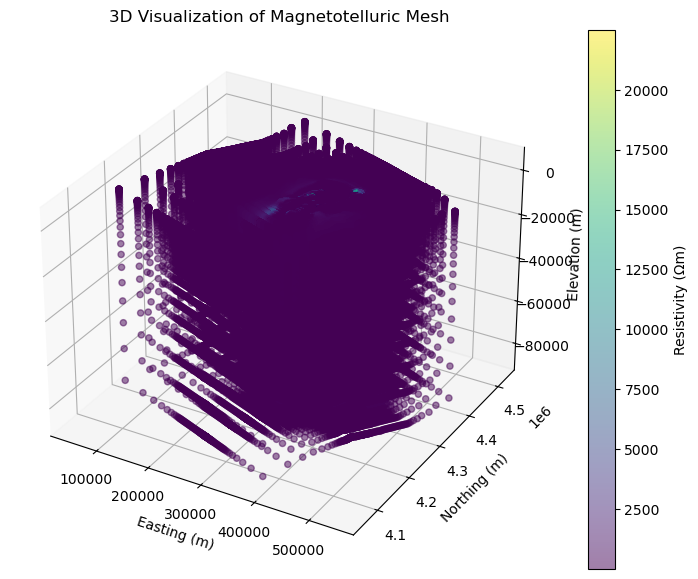

In [5]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_magnetotelluric_matplotlib(df):
    """ Plota os nós da malha em 3D usando Matplotlib """
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Extrair coordenadas
    x = df["easting"]
    y = df["northing"]
    z = df["elevation"]
    c = df["resistivity"]

    # Criar scatter plot
    sc = ax.scatter(x, y, z, c=c, cmap="viridis", marker='o', alpha=0.5)
    fig.colorbar(sc, label="Resistivity (Ωm)")

    # Rótulos dos eixos
    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")
    ax.set_zlabel("Elevation (m)")
    ax.set_title("3D Visualization of Magnetotelluric Mesh")

    plt.show()

# Chamar a função para plotar
plot_magnetotelluric_matplotlib(df)

In [6]:
import pyvista as pv

def plot_magnetotelluric_pyvista(df):
    """ Plota a malha magnetotelúrica em 3D usando PyVista """
    cloud = pv.PolyData(df[["easting", "northing", "elevation"]].values)

    # Criar uma plotagem 3D interativa
    plotter = pv.Plotter()
    plotter.add_mesh(cloud, scalars=df["resistivity"], cmap="viridis", point_size=5, render_points_as_spheres=True)
    plotter.add_axes()
    plotter.show_grid()
    plotter.show()

# Chamar a função para visualizar
plot_magnetotelluric_pyvista(df)


Widget(value='<iframe src="http://localhost:41433/index.html?ui=P_0x7ba0caaa4e20_0&reconnect=auto" class="pyvi…

In [7]:
def restructure_grid_fixed(df, nx, ny, nz):
    """
    Reestrutura o DataFrame para formar um grid estruturado 3D corretamente.
    """
    # Criar matrizes vazias para as coordenadas e resistividade
    x = np.full((nx, ny, nz), np.nan)
    y = np.full((nx, ny, nz), np.nan)
    z = np.full((nx, ny, nz), np.nan)
    resistivity = np.full((nx, ny, nz), np.nan)

    # Iterar sobre os dados e preencher os grids
    for _, row in df.iterrows():
        ix, iy, iz = int(row["in"]) - 1, int(row["ie"]) - 1, int(row["iz"]) - 1
        if (0 <= ix < nx) and (0 <= iy < ny) and (0 <= iz < nz):  # Evita erros de índice
            x[ix, iy, iz] = row["easting"]
            y[ix, iy, iz] = row["northing"]
            z[ix, iy, iz] = row["elevation"]
            resistivity[ix, iy, iz] = row["resistivity"]

    return x, y, z, resistivity

# Aplicar a correção
x, y, z, resistivity = restructure_grid_fixed(df, 206, 201, 66)


/tmp/ipykernel_16340/2237740856.py:13: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  img = ax.pcolormesh(x[:, :, slice_idx], y[:, :, slice_idx], resistivity[:, :, slice_idx], shading="auto", cmap="viridis")


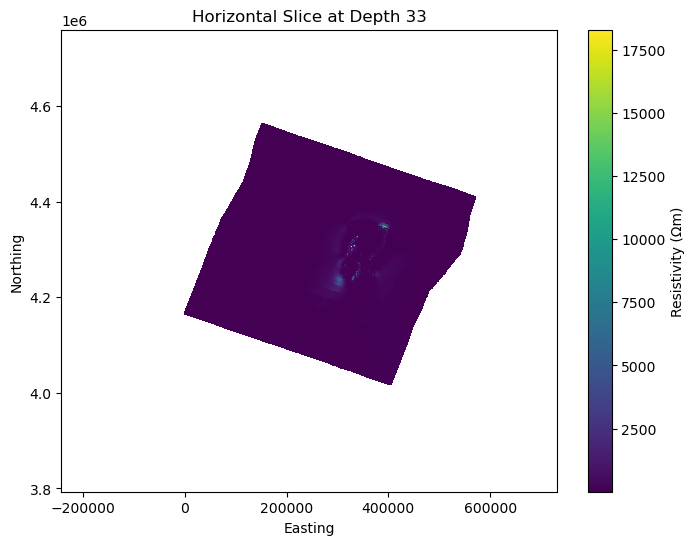

In [9]:
import matplotlib.pyplot as plt

def plot_magnetotelluric_slices_matplotlib(x, y, z, resistivity, slice_idx=33, axis="z"):
    """
    Plota uma fatia 2D da resistividade no Matplotlib.
    
    - slice_idx: Índice da fatia (padrão: centro da malha)
    - axis: Eixo do corte ('x', 'y' ou 'z')
    """
    fig, ax = plt.subplots(figsize=(8, 6))

    if axis == "z":  # Fatia horizontal (profundidade constante)
        img = ax.pcolormesh(x[:, :, slice_idx], y[:, :, slice_idx], resistivity[:, :, slice_idx], shading="auto", cmap="viridis")
        ax.set_xlabel("Easting")
        ax.set_ylabel("Northing")
        ax.set_title(f"Horizontal Slice at Depth {slice_idx}")
    elif axis == "x":  # Fatia vertical em X (norte)
        img = ax.pcolormesh(y[slice_idx, :, :], z[slice_idx, :, :], resistivity[slice_idx, :, :], shading="auto", cmap="viridis")
        ax.set_xlabel("Northing")
        ax.set_ylabel("Elevation")
        ax.set_title(f"Vertical Slice at North Index {slice_idx}")
    elif axis == "y":  # Fatia vertical em Y (leste)
        img = ax.pcolormesh(x[:, slice_idx, :], z[:, slice_idx, :], resistivity[:, slice_idx, :], shading="auto", cmap="viridis")
        ax.set_xlabel("Easting")
        ax.set_ylabel("Elevation")
        ax.set_title(f"Vertical Slice at East Index {slice_idx}")

    fig.colorbar(img, label="Resistivity (Ωm)")
    plt.show()

# Chamar a função para visualizar uma fatia horizontal no meio da malha
plot_magnetotelluric_slices_matplotlib(x, y, z, resistivity, slice_idx=33, axis="z")


/tmp/ipykernel_16340/3664746104.py:18: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  img = ax.pcolormesh(x_centers, y_centers, res_slice, shading="nearest", cmap="viridis")


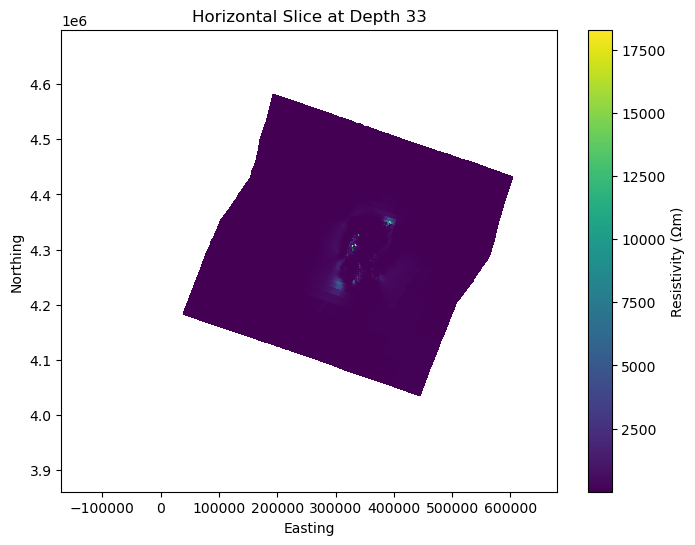

In [10]:
import matplotlib.pyplot as plt
import numpy as np

def plot_magnetotelluric_slices_matplotlib(x, y, z, resistivity, slice_idx=33, axis="z"):
    """
    Plota uma fatia 2D da resistividade no Matplotlib.
    
    - slice_idx: Índice da fatia (padrão: centro da malha)
    - axis: Eixo do corte ('x', 'y' ou 'z')
    """
    fig, ax = plt.subplots(figsize=(8, 6))

    if axis == "z":  # Fatia horizontal (profundidade constante)
        x_centers = (x[:-1, :-1, slice_idx] + x[1:, 1:, slice_idx]) / 2
        y_centers = (y[:-1, :-1, slice_idx] + y[1:, 1:, slice_idx]) / 2
        res_slice = resistivity[:-1, :-1, slice_idx]

        img = ax.pcolormesh(x_centers, y_centers, res_slice, shading="nearest", cmap="viridis")

        ax.set_xlabel("Easting")
        ax.set_ylabel("Northing")
        ax.set_title(f"Horizontal Slice at Depth {slice_idx}")

    elif axis == "x":  # Fatia vertical em X (norte)
        y_centers = (y[slice_idx, :-1, :-1] + y[slice_idx, 1:, 1:]) / 2
        z_centers = (z[slice_idx, :-1, :-1] + z[slice_idx, 1:, 1:]) / 2
        res_slice = resistivity[slice_idx, :-1, :-1]

        img = ax.pcolormesh(y_centers, z_centers, res_slice, shading="nearest", cmap="viridis")

        ax.set_xlabel("Northing")
        ax.set_ylabel("Elevation")
        ax.set_title(f"Vertical Slice at North Index {slice_idx}")

    elif axis == "y":  # Fatia vertical em Y (leste)
        x_centers = (x[:-1, slice_idx, :-1] + x[1:, slice_idx, 1:]) / 2
        z_centers = (z[:-1, slice_idx, :-1] + z[1:, slice_idx, 1:]) / 2
        res_slice = resistivity[:-1, slice_idx, :-1]

        img = ax.pcolormesh(x_centers, z_centers, res_slice, shading="nearest", cmap="viridis")

        ax.set_xlabel("Easting")
        ax.set_ylabel("Elevation")
        ax.set_title(f"Vertical Slice at East Index {slice_idx}")

    fig.colorbar(img, label="Resistivity (Ωm)")
    plt.show()

# Chamar a função corrigida para visualizar uma fatia horizontal no meio da malha
plot_magnetotelluric_slices_matplotlib(x, y, z, resistivity, slice_idx=33, axis="z")


In [11]:
import pyvista as pv
import numpy as np

def plot_magnetotelluric_grid_pyvista(x, y, z, resistivity):
    """
    Plota a malha magnetotelúrica em 3D com PyVista usando um grid estruturado.
    """
    # Criar um StructuredGrid para representar a malha
    grid = pv.StructuredGrid(x, y, z)

    # Adicionar resistividade como escalar ao grid
    grid["resistivity"] = resistivity.flatten(order="F")

    # Criar um visualizador interativo
    plotter = pv.Plotter()
    plotter.add_mesh(grid, scalars="resistivity", cmap="viridis", opacity=0.7, show_edges=True)
    
    # Adicionar cortes interativos
    plotter.add_mesh(grid.slice(normal=[1, 0, 0]), scalars="resistivity", cmap="viridis")
    plotter.add_mesh(grid.slice(normal=[0, 1, 0]), scalars="resistivity", cmap="viridis")
    plotter.add_mesh(grid.slice(normal=[0, 0, 1]), scalars="resistivity", cmap="viridis")

    plotter.add_axes()
    plotter.show_grid()
    plotter.show()

# Chamar a função para visualizar a malha 3D
plot_magnetotelluric_grid_pyvista(x, y, z, resistivity)


/home/marcus/anaconda3/envs/pyvista_v1/lib/python3.10/site-packages/pyvista/plotting/mapper.py:669: RuntimeWarning: All-NaN axis encountered
  clim = [np.nanmin(scalars), np.nanmax(scalars)]


Widget(value='<iframe src="http://localhost:41433/index.html?ui=P_0x7ba0cac9e770_1&reconnect=auto" class="pyvi…

In [12]:
import numpy as np
import pyvista as pv

def plot_magnetotelluric_grid_filtered(x, y, z, resistivity):
    """
    Plota a malha magnetotelúrica em 3D no PyVista, removendo células com NaN.
    """
    # Criar grid estruturado
    grid = pv.StructuredGrid(x, y, z)

    # Criar uma máscara para identificar células válidas
    valid_mask = np.isfinite(resistivity)

    # Criar um novo grid contendo apenas células válidas
    resistivity_filtered = np.where(valid_mask, resistivity, np.nanmin(resistivity[np.isfinite(resistivity)]))

    # Adicionar a resistividade filtrada ao grid
    grid["resistivity"] = resistivity_filtered.flatten(order="F")

    # Criar a visualização interativa
    plotter = pv.Plotter()
    plotter.add_mesh(grid, scalars="resistivity", cmap="viridis", opacity=0.7, show_edges=True)
    
    # Adicionar cortes interativos para explorar o volume
    plotter.add_mesh(grid.slice(normal=[1, 0, 0]), scalars="resistivity", cmap="viridis")
    plotter.add_mesh(grid.slice(normal=[0, 1, 0]), scalars="resistivity", cmap="viridis")
    plotter.add_mesh(grid.slice(normal=[0, 0, 1]), scalars="resistivity", cmap="viridis")

    plotter.add_axes()
    plotter.show_grid()
    plotter.show()

# Executar a função corrigida
plot_magnetotelluric_grid_filtered(x, y, z, resistivity)


Widget(value='<iframe src="http://localhost:41433/index.html?ui=P_0x7ba0cab82a70_2&reconnect=auto" class="pyvi…

In [13]:
import pandas as pd
import numpy as np

def extract_planes_from_grid(x, y, z, resistivity, elevation_levels):
    """
    Extrai DataFrames para diferentes planos de elevação considerando as células do grid.
    
    - x, y, z: Arrays estruturados do grid
    - resistivity: Resistividade associada a cada célula
    - elevation_levels: Lista de níveis de elevação desejados
    """

    df_planes = {}  # Dicionário para armazenar os DataFrames por cota
    
    for level in elevation_levels:
        mask = (z[:-1, :-1, :-1] >= level) & (z[1:, 1:, 1:] <= level)  # Identifica células que englobam a elevação
        x_plane = x[:-1, :-1, :-1][mask]  # Seleciona os easting dessas células
        y_plane = y[:-1, :-1, :-1][mask]  # Seleciona os northing dessas células
        resistivity_plane = resistivity[:-1, :-1, :-1][mask]  # Obtém a resistividade correspondente
        
        df_planes[level] = pd.DataFrame({"easting": x_plane, "northing": y_plane, "resistivity": resistivity_plane, "elevation": level})
    
    return df_planes

# Definir os planos de elevação desejados
elevation_levels = [1500, 1000, 500, 0, -500, -1000]

# Criar os DataFrames com os valores correspondentes às elevações
df_planes = extract_planes_from_grid(x, y, z, resistivity, elevation_levels)


In [14]:
import numpy as np
import pyvista as pv

def plot_magnetotelluric_grid_log10(x, y, z, resistivity):
    """
    Plota a malha magnetotelúrica em 3D no PyVista, aplicando escala logarítmica na resistividade.
    """
    # Criar grid estruturado
    grid = pv.StructuredGrid(x, y, z)

    # Remover valores NaN e evitar problemas ao calcular log10
    valid_mask = np.isfinite(resistivity) & (resistivity > 0)
    
    # Substituir NaN pelo menor valor válido e aplicar log10
    min_valid_resistivity = np.nanmin(resistivity[valid_mask])
    resistivity_fixed = np.where(valid_mask, resistivity, min_valid_resistivity)
    resistivity_log10 = np.log10(resistivity_fixed)

    # Adicionar a resistividade em escala logarítmica ao grid
    grid["log10_resistivity"] = resistivity_log10.flatten(order="F")

    # Criar a visualização interativa
    plotter = pv.Plotter()
    plotter.add_mesh(grid, scalars="log10_resistivity", cmap="viridis", opacity=0.7, show_edges=True)
    
    # Adicionar cortes interativos para explorar o volume
    plotter.add_mesh(grid.slice(normal=[1, 0, 0]), scalars="log10_resistivity", cmap="viridis")
    plotter.add_mesh(grid.slice(normal=[0, 1, 0]), scalars="log10_resistivity", cmap="viridis")
    plotter.add_mesh(grid.slice(normal=[0, 0, 1]), scalars="log10_resistivity", cmap="viridis")

    plotter.add_axes()
    plotter.show_grid()
    plotter.show()

# Executar a função corrigida
plot_magnetotelluric_grid_log10(x, y, z, resistivity)


Widget(value='<iframe src="http://localhost:41747/index.html?ui=P_0x70c2e24bc310_3&reconnect=auto" class="pyvi…

In [15]:
import pandas as pd

# Definir os limites de filtragem
northing_min, northing_max = 4249124.46, 4272661.41
easting_min, easting_max = 323248.37, 347342.93
elevation_min = -1200

# Filtrar os dados dentro dos limites
df_filtered = df[
    (df["northing"] >= northing_min) & (df["northing"] <= northing_max) &
    (df["easting"] >= easting_min) & (df["easting"] <= easting_max) &
    (df["elevation"] >= elevation_min)
]

# Definir as cotas desejadas
elevation_levels = [1500, 1000, 500, 0, -500, -1000]

# Criar um dicionário para armazenar os DataFrames filtrados por cota
df_planes = {}

for level in elevation_levels:
    df_planes[level] = df_filtered[df_filtered["elevation"] == level]

In [16]:
import pyvista as pv
import numpy as np

def plot_filtered_grid_3D(df_filtered):
    """
    Plota o grid 3D da malha sísmica filtrada até elevation -1200, considerando os limites de easting e northing.
    """
    # Extrair valores
    x = df_filtered["easting"].values
    y = df_filtered["northing"].values
    z = df_filtered["elevation"].values
    resistivity = df_filtered["resistivity"].values

    # Criar um StructuredGrid
    grid = pv.StructuredGrid(x, y, z)

    # Adicionar resistividade ao grid
    grid["resistivity"] = np.log10(resistivity + 1e-3)  # Aplicar escala log10, evitando log(0)

    # Criar o plot 3D
    plotter = pv.Plotter()
    plotter.add_mesh(grid, scalars="resistivity", cmap="viridis", opacity=0.7, show_edges=True)
    
    # Adicionar cortes interativos para explorar o volume
    plotter.add_mesh(grid.slice(normal=[1, 0, 0]), scalars="resistivity", cmap="viridis")
    plotter.add_mesh(grid.slice(normal=[0, 1, 0]), scalars="resistivity", cmap="viridis")
    plotter.add_mesh(grid.slice(normal=[0, 0, 1]), scalars="resistivity", cmap="viridis")

    plotter.add_axes()
    plotter.show_grid()
    plotter.show()

# Rodar a função para visualizar o grid 3D filtrado
plot_filtered_grid_3D(df_filtered)


/home/marcus/anaconda3/envs/pyvista_v1/lib/python3.10/site-packages/pyvista/plotting/mapper.py:669: RuntimeWarning: All-NaN axis encountered
  clim = [np.nanmin(scalars), np.nanmax(scalars)]


Widget(value='<iframe src="http://localhost:41747/index.html?ui=P_0x70c2d4c1c460_4&reconnect=auto" class="pyvi…

In [16]:
#extrapolei o plano de elevation=0 para melhorar a visualizaçao

import matplotlib.pyplot as plt
import numpy as np

# ---------------------------
# 1. Filtrar os Dados por Elevation_m
# ---------------------------
filtered_data = data[data['Elevation_m'] >= -1000]

# ---------------------------
# 2. Extrair as Coordenadas e Valores
# ---------------------------
# Extrair coordenadas e valores da propriedade
northing = filtered_data['Northing_m'].values
easting = filtered_data['Easting_m'].values
elevation = filtered_data['Elevation_m'].values
resistivity = filtered_data['Resistivity_ohmm'].values

# ---------------------------
# 3. Criar a Visualização
# ---------------------------
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Adicionar os pontos da nuvem de dados
scatter = ax.scatter(northing, easting, elevation, c=resistivity, cmap='viridis', s=20, edgecolor='k')

# Adicionar o plano em Elevation_m = 0 com extrapolação
extrapolation_factor = 0.1  # 10% de extrapolação
northing_min = northing.min() - (northing.max() - northing.min()) * extrapolation_factor
northing_max = northing.max() + (northing.max() - northing.min()) * extrapolation_factor
easting_min = easting.min() - (easting.max() - easting.min()) * extrapolation_factor
easting_max = easting.max() + (easting.max() - easting.min()) * extrapolation_factor

northing_range = np.linspace(northing_min, northing_max, 10)
easting_range = np.linspace(easting_min, easting_max, 10)
northing_grid, easting_grid = np.meshgrid(northing_range, easting_range)
elevation_grid = np.zeros_like(northing_grid)  # Elevation_m = 0 para todo o plano
ax.plot_surface(northing_grid, easting_grid, elevation_grid, color='black', alpha=0.8)

# Configurar os rótulos dos eixos
ax.set_xlabel('Northing (m)')
ax.set_ylabel('Easting (m)')
ax.set_zlabel('Elevation (m)')
plt.title('Nuvem de Pontos com Plano Extrapolado em Elevation_m = 0')

# Adicionar barra de cores
cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Resistivity (ohm·m)', rotation=270, labelpad=15)

# ---------------------------
# 4. Configurar o Ângulo de Visualização
# ---------------------------
elevation_angle = 90  # Ângulo de elevação (em graus)
azimuth_angle = 180    # Ângulo azimutal (em graus)
ax.view_init(elev=elevation_angle, azim=azimuth_angle)

# Mostrar o gráfico
plt.show()


NameError: name 'data' is not defined

In [6]:
#Visualizaçao com plano elevation=0 no pyvista para melhor perspectiva, uma vez que o 3d do matplotlib nao funcionou, alem disso pode-se perceber que 
# há uma repetião nos dados de latitude e longitude , apenas variam as elevations

import pyvista as pv
import numpy as np
import pandas as pd

# Supondo que 'data' seja um DataFrame do pandas contendo suas colunas
# Filtrar os Dados por Elevation_m
filtered_data = data[data['Elevation_m'] >= -1000]

# Extrair as Coordenadas e Valores
northing = filtered_data['Northing_m'].values
easting = filtered_data['Easting_m'].values
elevation = filtered_data['Elevation_m'].values
resistivity = filtered_data['Resistivity_ohmm'].values

# Criar um objeto de malha para a nuvem de pontos
points = np.column_stack((northing, easting, elevation))
point_cloud = pv.PolyData(points)

# Adicionar o valor de resistividade como um campo de dados
point_cloud.point_data['Resistivity'] = resistivity

# Criar a visualização
plotter = pv.Plotter()

# Adicionar a nuvem de pontos ao plotter
plotter.add_mesh(point_cloud, scalars='Resistivity', cmap='viridis', point_size=5)

# Adicionar o plano de extrapolação em Elevation_m = 0
extrapolation_factor = 0.1  # 10% de extrapolação
northing_min = northing.min() - (northing.max() - northing.min()) * extrapolation_factor
northing_max = northing.max() + (northing.max() - northing.min()) * extrapolation_factor
easting_min = easting.min() - (easting.max() - easting.min()) * extrapolation_factor
easting_max = easting.max() + (easting.max() - easting.min()) * extrapolation_factor

northing_range = np.linspace(northing_min, northing_max, 10)
easting_range = np.linspace(easting_min, easting_max, 10)
northing_grid, easting_grid = np.meshgrid(northing_range, easting_range)
elevation_grid = np.zeros_like(northing_grid)  # Elevation_m = 0 para todo o plano

# Criar a malha do plano
plane_points = np.column_stack((northing_grid.flatten(), easting_grid.flatten(), elevation_grid.flatten()))
plane = pv.PolyData(plane_points)

# Adicionar o plano à visualização
plotter.add_mesh(plane, color='black', opacity=0.8)

# Configurar a visualização
plotter.set_background('white')
plotter.add_axes()  # Adiciona os eixos
plotter.show()


Widget(value='<iframe src="http://localhost:41235/index.html?ui=P_0x78bafa96fb80_2&reconnect=auto" class="pyvi…

In [8]:
import pyvista as pv
import numpy as np
import pandas as pd

# Supondo que 'data' seja um DataFrame do pandas contendo suas colunas
# Filtrar os Dados por Elevation_m
filtered_data = data[data['Elevation_m'] >= -1500]

# Extrair as Coordenadas e Valores
northing = filtered_data['Northing_m'].values
easting = filtered_data['Easting_m'].values
elevation = filtered_data['Elevation_m'].values
resistivity = filtered_data['Resistivity_ohmm'].values

# Criar um objeto de malha para a nuvem de pontos
points = np.column_stack((northing, easting, elevation))
point_cloud = pv.PolyData(points)

# Adicionar o valor de resistividade como um campo de dados
point_cloud.point_data['Resistivity'] = resistivity

# Criar a visualização
plotter = pv.Plotter()

# Adicionar a nuvem de pontos ao plotter
plotter.add_mesh(point_cloud, scalars='Resistivity', cmap='viridis', point_size=5)

# Adicionar o plano de extrapolação em Elevation_m = 0
extrapolation_factor = 0.1  # 10% de extrapolação
northing_min = northing.min() - (northing.max() - northing.min()) * extrapolation_factor
northing_max = northing.max() + (northing.max() - northing.min()) * extrapolation_factor
easting_min = easting.min() - (easting.max() - easting.min()) * extrapolation_factor
easting_max = easting.max() + (easting.max() - easting.min()) * extrapolation_factor

# Definir o centro do plano, normal (perpendicular ao plano) e as dimensões
center = [(northing_min + northing_max) / 2, (easting_min + easting_max) / 2, 0]  # Centro na linha do solo (z=0)
normal = [0, 0, 1]  # Normal ao plano (plano horizontal)
i_size = northing_max - northing_min  # Tamanho do plano na direção x
j_size = easting_max - easting_min  # Tamanho do plano na direção y

# Criar o plano usando o método 'pyvista.Plane()'
plane = pv.Plane(center=center, direction=normal, i_size=i_size, j_size=j_size)

# Adicionar o plano à visualização
plotter.add_mesh(plane, color='black', opacity=0.8)

# Configurar a visualização
plotter.set_background('white')
plotter.add_axes()  # Adiciona os eixos
plotter.show()


Widget(value='<iframe src="http://localhost:41235/index.html?ui=P_0x78bafa96e650_4&reconnect=auto" class="pyvi…

In [5]:
# Contagem de quantos Northing e Easting se repetem juntos
import pandas as pd

# Agrupar por Northing_m e Easting_m e contar as ocorrências
repeated_data = filtered_data.groupby(['Northing_m', 'Easting_m']).size().reset_index(name='Count')

# Filtrar para mostrar apenas os valores repetidos (onde a contagem é maior que 1)
repeated_data = repeated_data[repeated_data['Count'] > 1]

# Exibir os resultados
print(repeated_data)


      Northing_m  Easting_m  Count
0      4249156.0   346606.2     25
1      4249161.0   343387.9     26
2      4249168.0   332567.2     25
3      4249183.0   327262.2     25
4      4249190.0   329875.3     25
...          ...        ...    ...
6893   4272637.0   326843.8     25
6894   4272638.0   346396.6     25
6895   4272640.0   337626.0     25
6896   4272650.0   341978.9     25
6897   4272661.0   344872.0     25

[6898 rows x 3 columns]


In [6]:
#Contar se há dados que não se repetem de latitude e longitude, não existia dados com localidade unica e apenas um elevation
import pandas as pd

# Agrupar por Northing_m e Easting_m e contar as ocorrências
unique_data = filtered_data.groupby(['Northing_m', 'Easting_m']).size().reset_index(name='Count')

# Filtrar para mostrar apenas os valores que não se repetem (onde a contagem é 1)
unique_data = unique_data[unique_data['Count'] == 1]

# Exibir os resultados
print(unique_data)


Empty DataFrame
Columns: [Northing_m, Easting_m, Count]
Index: []


In [7]:
#agrupei os dados de latitude e longitude que se repetem, em ordem decrescente de elevation

import pandas as pd

# Agrupar os dados por Northing_m e Easting_m e contar as ocorrências
repeated_data = filtered_data.groupby(['Northing_m', 'Easting_m']).size().reset_index(name='Count')

# Filtrar os pares que se repetem (onde a contagem é maior que 1)
repeated_data = repeated_data[repeated_data['Count'] > 1]

# Inicializar uma lista para armazenar os dados ordenados
ordered_data = []

# Para cada par de Northing_m, Easting_m, buscar os dados repetidos e ordenar por Elevation_m de forma decrescente
for _, row in repeated_data.iterrows():
    northing_value = row['Northing_m']
    easting_value = row['Easting_m']
    
    # Filtrar os dados para esse par de coordenadas
    group_data = filtered_data[(filtered_data['Northing_m'] == northing_value) & 
                               (filtered_data['Easting_m'] == easting_value)]
    
    # Ordenar por Elevation_m de forma decrescente
    group_data_sorted = group_data.sort_values(by='Elevation_m', ascending=False)
    
    # Adicionar os dados ordenados à lista
    ordered_data.append(group_data_sorted[['Northing_m', 'Easting_m', 'Elevation_m', 'Resistivity_ohmm']])

# Concatenar todos os grupos ordenados em um único DataFrame
final_data = pd.concat(ordered_data, ignore_index=True)

# Exibir o DataFrame resultante
print(final_data)


        Northing_m  Easting_m  Elevation_m  Resistivity_ohmm
0        4249156.0   346606.2   1964.94200            634.61
1        4249156.0   346606.2   1939.94200            636.12
2        4249156.0   346606.2   1923.69200            637.52
3        4249156.0   346606.2   1911.19200            638.73
4        4249156.0   346606.2   1898.69200            640.02
...            ...        ...          ...               ...
173296   4272661.0   344872.0    270.78810            153.05
173297   4272661.0   344872.0    -19.66878            211.32
173298   4272661.0   344872.0   -368.31740            279.84
173299   4272661.0   344872.0   -786.69570            349.37
173300   4272661.0   344872.0  -1288.85000            409.06

[173301 rows x 4 columns]


In [8]:
# Verifiquei dos dados que se repetem em latitude e longitude, o modulo da diferença entre 0 e cada um dos dois menores valores de elevationt, desses dados de latitude e longitude que se repetem

import pandas as pd
import numpy as np

# Inicializar uma lista para armazenar os dados processados
modulo_data = []

# Para cada par de Northing_m, Easting_m no DataFrame final_data
for (northing_value, easting_value), group in final_data.groupby(['Northing_m', 'Easting_m']):
    # Calcular o módulo da diferença entre Elevation_m e 0
    group['Modulo'] = np.abs(group['Elevation_m'])
    
    # Ordenar os dados por Modulo de forma crescente
    group_sorted = group.sort_values(by='Modulo').head(2)  # Pegar os dois menores valores
    
    # Para cada dos dois menores, armazenar Northing_m, Easting_m, Elevation_m e Modulo
    for _, row in group_sorted.iterrows():
        modulo_data.append([row['Northing_m'], row['Easting_m'], row['Elevation_m'], row['Modulo']])

# Criar um novo DataFrame com os resultados
modulo_df = pd.DataFrame(modulo_data, columns=['Northing_m', 'Easting_m', 'Elevation_m', 'Modulo'])

# Exibir o DataFrame resultante
print(modulo_df)


       Northing_m  Easting_m  Elevation_m     Modulo
0       4249156.0   346606.2    -97.02674   97.02674
1       4249156.0   346606.2    253.23480  253.23480
2       4249161.0   343387.9    197.49760  197.49760
3       4249161.0   343387.9   -224.91760  224.91760
4       4249168.0   332567.2    -12.79796   12.79796
...           ...        ...          ...        ...
13791   4272640.0   337626.0    206.19870  206.19870
13792   4272650.0   341978.9    -66.54854   66.54854
13793   4272650.0   341978.9    283.89430  283.89430
13794   4272661.0   344872.0    -19.66878   19.66878
13795   4272661.0   344872.0    270.78810  270.78810

[13796 rows x 4 columns]


In [9]:
# Salvadno o Dado com resistivity_ohmm

import pandas as pd
import numpy as np

# Inicializar uma lista para armazenar os dados processados
modulo_data = []

# Para cada par de Northing_m, Easting_m no DataFrame final_data
for (northing_value, easting_value), group in final_data.groupby(['Northing_m', 'Easting_m']):
    # Calcular o módulo da diferença entre Elevation_m e 0
    group['Modulo'] = np.abs(group['Elevation_m'])
    
    # Ordenar os dados por Modulo de forma crescente
    group_sorted = group.sort_values(by='Modulo').head(2)  # Pegar os dois menores valores
    
    # Para cada dos dois menores, armazenar Northing_m, Easting_m, Elevation_m e Modulo
    for _, row in group_sorted.iterrows():
        modulo_data.append([row['Northing_m'], row['Easting_m'], row['Elevation_m'],row['Resistivity_ohmm'], row['Modulo']])

# Criar um novo DataFrame com os resultados
modulo_df_v1 = pd.DataFrame(modulo_data, columns=['Northing_m', 'Easting_m', 'Elevation_m','Resistivity_ohmm', 'Modulo'])

# Exibir o DataFrame resultante
print(modulo_df_v1)


       Northing_m  Easting_m  Elevation_m  Resistivity_ohmm     Modulo
0       4249156.0   346606.2    -97.02674           1087.62   97.02674
1       4249156.0   346606.2    253.23480            932.65  253.23480
2       4249161.0   343387.9    197.49760            400.89  197.49760
3       4249161.0   343387.9   -224.91760            466.89  224.91760
4       4249168.0   332567.2    -12.79796           1180.76   12.79796
...           ...        ...          ...               ...        ...
13791   4272640.0   337626.0    206.19870             25.71  206.19870
13792   4272650.0   341978.9    -66.54854           5799.57   66.54854
13793   4272650.0   341978.9    283.89430           6355.05  283.89430
13794   4272661.0   344872.0    -19.66878            211.32   19.66878
13795   4272661.0   344872.0    270.78810            153.05  270.78810

[13796 rows x 5 columns]


In [13]:
#dividi o dado em dois dataframes, um que leva em consideraçao apenas o menor entre os dois valores, sem levr em consideração um valor limite
#e outro dataframe que salva apenas dados com modulo menores que 50 m de elevation

import pandas as pd
import numpy as np

# Inicializar listas para armazenar os dados processados
modulo_min_data = []  # Para o primeiro DataFrame
modulo_threshold_data = []  # Para o segundo DataFrame

# Iterar sobre pares de Northing_m e Easting_m
for (northing_value, easting_value), group in final_data.groupby(['Northing_m', 'Easting_m']):
    # Calcular o módulo da diferença entre Elevation_m e 0
    group['Modulo'] = np.abs(group['Elevation_m'])
    
    # **Primeiro DataFrame**: Salvar o menor módulo para cada par de Northing_m e Easting_m
    group_sorted_min = group.loc[group['Modulo'].idxmin()]  # Obter a linha com o menor módulo
    modulo_min_data.append([
        group_sorted_min['Northing_m'],
        group_sorted_min['Easting_m'],
        group_sorted_min['Elevation_m'],
        group_sorted_min['Resistivity_ohmm']
    ])
    
    # **Segundo DataFrame**: Salvar apenas se o menor módulo for menor que 50
    if group_sorted_min['Modulo'] < 50:
        modulo_threshold_data.append([
            group_sorted_min['Northing_m'],
            group_sorted_min['Easting_m'],
            group_sorted_min['Elevation_m'],
            group_sorted_min['Resistivity_ohmm']
        ])

# Criar os DataFrames
df_modulo_min = pd.DataFrame(modulo_min_data, columns=['Northing_m', 'Easting_m', 'Elevation_m', 'Resistivity_ohmm'])
df_modulo_threshold = pd.DataFrame(modulo_threshold_data, columns=['Northing_m', 'Easting_m', 'Elevation_m', 'Resistivity_ohmm'])

# Exibir os DataFrames resultantes
print("Primeiro DataFrame (Menor Módulo):")
print(df_modulo_min)

print("\nSegundo DataFrame (Módulo < 50):")
print(df_modulo_threshold)

# Opcional: Salvar os DataFrames em arquivos CSV
df_modulo_min.to_csv("/home/marcus/Documentos/qualificacao_mestrado/codigo_marcus/codigo_marcus/codigo_modelo_temperatura/magnetotellurics/magtellu_min_depth_0m.csv", index=False)
df_modulo_threshold.to_csv("/home/marcus/Documentos/qualificacao_mestrado/codigo_marcus/codigo_marcus/codigo_modelo_temperatura/magnetotellurics/magtellu_lim_50_depth_0m.csv", index=False)


Primeiro DataFrame (Menor Módulo):
      Northing_m  Easting_m  Elevation_m  Resistivity_ohmm
0      4249156.0   346606.2    -97.02674           1087.62
1      4249161.0   343387.9    197.49760            400.89
2      4249168.0   332567.2    -12.79796           1180.76
3      4249183.0   327262.2    119.34150              3.16
4      4249190.0   329875.3   -112.87670             79.16
...          ...        ...          ...               ...
6893   4272637.0   326843.8     66.50352              0.61
6894   4272638.0   346396.6    -14.86072            112.76
6895   4272640.0   337626.0    -83.94167              6.16
6896   4272650.0   341978.9    -66.54854           5799.57
6897   4272661.0   344872.0    -19.66878            211.32

[6898 rows x 4 columns]

Segundo DataFrame (Módulo < 50):
      Northing_m  Easting_m  Elevation_m  Resistivity_ohmm
0      4249168.0   332567.2    -12.79796           1180.76
1      4249222.0   332417.8    -21.92840           1099.28
2      4249269.0   33

### Save all data with limits of elevation and without limits

In [10]:
import pandas as pd
import numpy as np
import os

def process_and_save_magnetotelluric_data(df, save_dir="/home/marcus/Documentos/qualificacao_mestrado/codigo_marcus/codigo_marcus/codigo_modelo_temperatura/magnetotellurics/"):
    """
    Processa os dados magnetotelúricos, aplica log na coluna 'Resistivity_ohmm',
    calcula o módulo da diferença entre 'Elevation_m' e os valores de referência
    [1500, 1000, 500, 0, -500, -1000], e salva os DataFrames resultantes.

    Args:
    - df (pd.DataFrame): DataFrame de entrada com colunas ['Northing_m', 'Easting_m', 'Elevation_m', 'Resistivity_ohmm'].
    - save_dir (str): Diretório onde os arquivos CSV serão salvos.

    Returns:
    - None (Os arquivos são salvos e os DataFrames são criados no escopo global)
    """

    # Garantir que o diretório de salvamento exista
    os.makedirs(save_dir, exist_ok=True)

    # Aplicar log na coluna 'Resistivity_ohmm'
    #df['Resistivity_ohmm'] = np.log(df['Resistivity_ohmm'])

    # Definir as elevações de referência para calcular o módulo da diferença
    elevation_refs = [1500, 1000, 500, 0, -500, -1000]

    # Iterar sobre cada elevação de referência
    for elevation_ref in elevation_refs:
        # Criar listas para armazenar os dados processados
        modulo_min_data = []
        modulo_threshold_data = []

        # Iterar sobre pares de Northing_m e Easting_m
        for (northing_value, easting_value), group in df.groupby(['Northing_m', 'Easting_m']):
            # Calcular o módulo da diferença entre Elevation_m e a elevação de referência
            group['Modulo'] = np.abs(group['Elevation_m'] - elevation_ref)

            # Selecionar a linha com o menor módulo
            group_sorted_min = group.loc[group['Modulo'].idxmin()]
            modulo_min_data.append([
                group_sorted_min['Northing_m'],
                group_sorted_min['Easting_m'],
                group_sorted_min['Elevation_m'],
                group_sorted_min['Resistivity_ohmm']
            ])

            # Adicionar ao segundo DataFrame apenas se o menor módulo for menor que 50
            if group_sorted_min['Modulo'] < 50:
                modulo_threshold_data.append([
                    group_sorted_min['Northing_m'],
                    group_sorted_min['Easting_m'],
                    group_sorted_min['Elevation_m'],
                    group_sorted_min['Resistivity_ohmm']
                ])

        # Criar os DataFrames
        df_modulo_min = pd.DataFrame(modulo_min_data, columns=['Northing_m', 'Easting_m', 'Elevation_m', 'Resistivity_ohmm'])
        df_modulo_threshold = pd.DataFrame(modulo_threshold_data, columns=['Northing_m', 'Easting_m', 'Elevation_m', 'Resistivity_ohmm'])

        # Criar nomes dos arquivos e DataFrames
        elevation_str = str(elevation_ref).replace("-", "minus")  # Substitui - por "minus" para evitar erros em nomes de arquivos

        filename_min = f"magtellu_min_depth_{elevation_str}m.csv"
        filename_threshold = f"magtellu_lim_50_depth_{elevation_str}m.csv"

        filepath_min = os.path.join(save_dir, filename_min)
        filepath_threshold = os.path.join(save_dir, filename_threshold)

        # Salvar os DataFrames em CSV
        df_modulo_min.to_csv(filepath_min, index=False)
        df_modulo_threshold.to_csv(filepath_threshold, index=False)

        print(f"✅ Arquivos salvos:\n  - {filepath_min}\n  - {filepath_threshold}")

        # Criar os DataFrames dinamicamente no escopo global
        globals()[f"df_modulo_min_{elevation_str}m"] = df_modulo_min
        globals()[f"df_modulo_threshold_{elevation_str}m"] = df_modulo_threshold

    print("\n✅ Processamento concluído! Os DataFrames foram criados e salvos.")

# Exemplo de uso:
process_and_save_magnetotelluric_data(final_data)


✅ Arquivos salvos:
  - /home/marcus/Documentos/qualificacao_mestrado/codigo_marcus/codigo_marcus/codigo_modelo_temperatura/magnetotellurics/magtellu_min_depth_1500m.csv
  - /home/marcus/Documentos/qualificacao_mestrado/codigo_marcus/codigo_marcus/codigo_modelo_temperatura/magnetotellurics/magtellu_lim_50_depth_1500m.csv
✅ Arquivos salvos:
  - /home/marcus/Documentos/qualificacao_mestrado/codigo_marcus/codigo_marcus/codigo_modelo_temperatura/magnetotellurics/magtellu_min_depth_1000m.csv
  - /home/marcus/Documentos/qualificacao_mestrado/codigo_marcus/codigo_marcus/codigo_modelo_temperatura/magnetotellurics/magtellu_lim_50_depth_1000m.csv
✅ Arquivos salvos:
  - /home/marcus/Documentos/qualificacao_mestrado/codigo_marcus/codigo_marcus/codigo_modelo_temperatura/magnetotellurics/magtellu_min_depth_500m.csv
  - /home/marcus/Documentos/qualificacao_mestrado/codigo_marcus/codigo_marcus/codigo_modelo_temperatura/magnetotellurics/magtellu_lim_50_depth_500m.csv
✅ Arquivos salvos:
  - /home/marcus/

### Visualize Resistivity without limit elevation Without Log

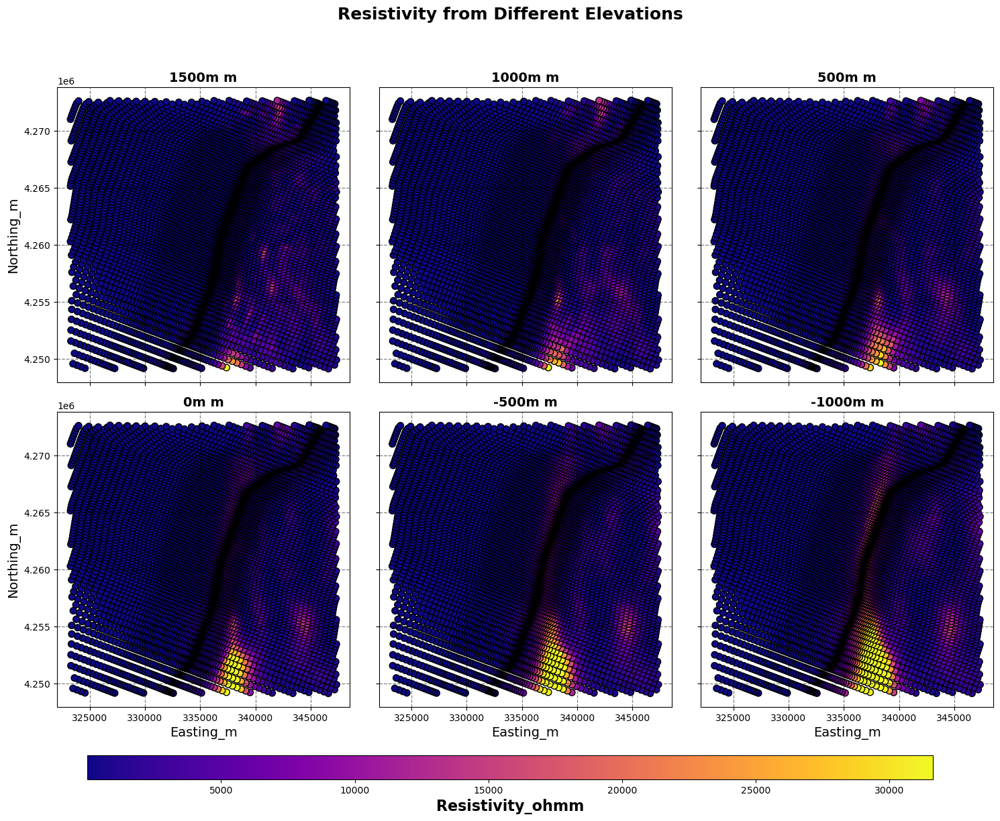

In [13]:
import matplotlib.pyplot as plt
import numpy as np

def plot_resistivity_subplots(dataframes, font_size=12, cmap_choice="viridis", subplot_spacing=0.3, grid_color="gray", grid_alpha=0.3):
    """
    Plota múltiplos DataFrames contendo dados de resistividade em diferentes elevações como subplots.

    Args:
    - dataframes (dict): Dicionário de DataFrames, onde as chaves são os nomes dos DataFrames e os valores são os DataFrames em si.
    - font_size (int): Tamanho da fonte para rótulos e títulos.
    - cmap_choice (str): Nome do colormap a ser usado.
    - subplot_spacing (float): Espaçamento entre os subplots.
    - grid_color (str): Cor do grid nos subplots.
    - grid_alpha (float): Transparência do grid nos subplots.

    Returns:
    - Exibe um gráfico com subplots representando os diferentes DataFrames.
    """
    
    # Definir a ordem correta das elevações para os subplots
    elevations = ["1500m", "1000m", "500m", "0m", "minus500m", "minus1000m"]
    
    # Criar a figura com 2 linhas e 3 colunas para os subplots
    fig, axes = plt.subplots(2, 3, figsize=(18, 12), sharex=True, sharey=True)
    fig.suptitle("Resistivity from Different Elevations", fontsize=font_size + 4, fontweight='bold')

    # Determinar limites globais para os eixos
    all_x = np.concatenate([df["Easting_m"].values for df in dataframes.values()])
    all_y = np.concatenate([df["Northing_m"].values for df in dataframes.values()])
    all_resistivity = np.concatenate([df["Resistivity_ohmm"].values for df in dataframes.values()])

    x_min, x_max = all_x.min(), all_x.max()
    y_min, y_max = all_y.min(), all_y.max()

    # Criar os subplots para cada DataFrame
    for i, (ax, elev) in enumerate(zip(axes.flatten(), elevations)):
        df_name = f"df_modulo_min_{elev}"
        if df_name in dataframes:  # Verifica se o DataFrame existe
            df = dataframes[df_name]
            sc = ax.scatter(df["Easting_m"], df["Northing_m"], c=df["Resistivity_ohmm"], 
                            cmap=cmap_choice, s=50, edgecolor="black")  # Sem normalização!
            ax.set_title(f"{elev.replace('minus', '-')} m", fontsize=font_size, fontweight='bold')

            # Aplicar grid nos subplots
            ax.grid(True, linestyle="--", linewidth=0.9, color=grid_color, alpha=grid_alpha)

            # Definir rótulos dos eixos apenas onde necessário
            if i % 3 == 0:  # Primeira coluna
                ax.set_ylabel("Northing_m", fontsize=font_size)
            if i >= 3:  # Última linha (índices 3, 4, 5)
                ax.set_xlabel("Easting_m", fontsize=font_size)

    # Adicionar uma barra de cores única abaixo de todos os subplots (sem normalização!)
    cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.03])
    cbar = plt.colorbar(sc, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Resistivity_ohmm", fontsize=font_size + 2, fontweight='bold')

    plt.subplots_adjust(hspace=subplot_spacing, wspace=subplot_spacing)  # Ajustar espaçamento dos subplots
    plt.show()


# **✅ Exemplo de Uso**
dataframes_dict = {
    "df_modulo_min_1500m": df_modulo_min_1500m,
    "df_modulo_min_1000m": df_modulo_min_1000m,
    "df_modulo_min_500m": df_modulo_min_500m,
    "df_modulo_min_0m": df_modulo_min_0m,
    "df_modulo_min_minus500m": df_modulo_min_minus500m,
    "df_modulo_min_minus1000m": df_modulo_min_minus1000m,
}

plot_resistivity_subplots(dataframes_dict, font_size=14, cmap_choice="plasma", subplot_spacing=0.1, grid_color="black", grid_alpha=0.5)


### Visualize Resistivity without limit elevation With log

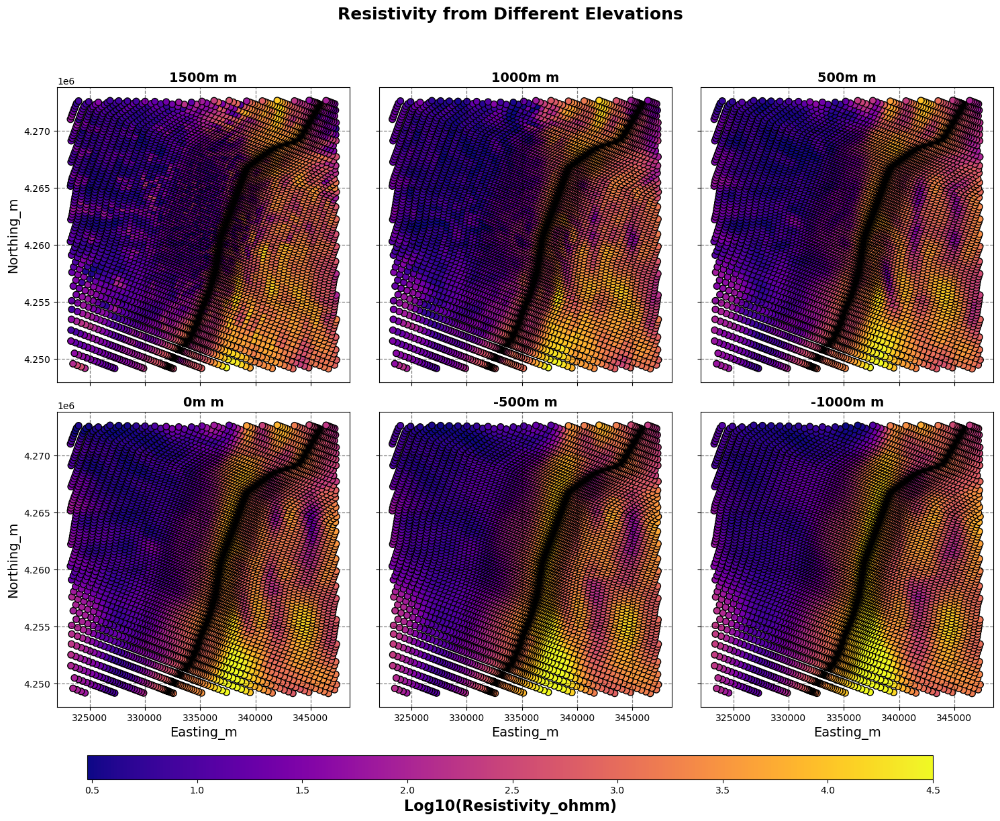

In [14]:
import matplotlib.pyplot as plt
import numpy as np

def plot_resistivity_subplots(dataframes, font_size=12, cmap_choice="viridis", subplot_spacing=0.3, 
                              grid_color="gray", grid_alpha=0.3):
    """
    Plota múltiplos DataFrames contendo dados de resistividade em diferentes elevações como subplots.
    Os valores de resistividade são convertidos para log10 de forma segura para evitar problemas com valores negativos e zero.

    Args:
    - dataframes (dict): Dicionário de DataFrames, onde as chaves são os nomes dos DataFrames e os valores são os DataFrames em si.
    - font_size (int): Tamanho da fonte para rótulos e títulos.
    - cmap_choice (str): Nome do colormap a ser usado.
    - subplot_spacing (float): Espaçamento entre os subplots.
    - grid_color (str): Cor do grid nos subplots.
    - grid_alpha (float): Transparência do grid nos subplots.

    Returns:
    - Exibe um gráfico com subplots representando os diferentes DataFrames.
    """

    # Definir a ordem correta das elevações para os subplots
    elevations = ["1500m", "1000m", "500m", "0m", "minus500m", "minus1000m"]
    
    # Criar a figura com 2 linhas e 3 colunas para os subplots
    fig, axes = plt.subplots(2, 3, figsize=(18, 12), sharex=True, sharey=True)
    fig.suptitle("Resistivity from Different Elevations", fontsize=font_size + 4, fontweight='bold')

    # Determinar limites globais para os eixos
    all_x = np.concatenate([df["Easting_m"].values for df in dataframes.values()])
    all_y = np.concatenate([df["Northing_m"].values for df in dataframes.values()])
    all_resistivity = np.concatenate([df["Resistivity_ohmm"].values for df in dataframes.values()])

    x_min, x_max = all_x.min(), all_x.max()
    y_min, y_max = all_y.min(), all_y.max()

    # Ajustar valores de resistividade para log10 de forma segura (evita problemas com valores negativos e zero)
    shift_value = abs(all_resistivity.min()) + 1  # Para garantir que os valores sejam positivos
    all_resistivity_log = np.log10(all_resistivity + shift_value)  # Aplicação do log seguro

    # Criar os subplots para cada DataFrame
    for i, (ax, elev) in enumerate(zip(axes.flatten(), elevations)):
        df_name = f"df_modulo_min_{elev}"
        if df_name in dataframes:  # Verifica se o DataFrame existe
            df = dataframes[df_name]
            
            # Transformação log segura para a resistividade
            df["Resistivity_ohmm_log"] = np.log10(df["Resistivity_ohmm"] + shift_value)
            
            sc = ax.scatter(df["Easting_m"], df["Northing_m"], c=df["Resistivity_ohmm_log"], 
                            cmap=cmap_choice, s=50, edgecolor="black")
            ax.set_title(f"{elev.replace('minus', '-')} m", fontsize=font_size, fontweight='bold')

            # Aplicar grid nos subplots
            ax.grid(True, linestyle="--", linewidth=0.9, color=grid_color, alpha=grid_alpha)

            # Definir rótulos dos eixos apenas onde necessário
            if i % 3 == 0:  # Primeira coluna
                ax.set_ylabel("Northing_m", fontsize=font_size)
            if i >= 3:  # Última linha (índices 3, 4, 5)
                ax.set_xlabel("Easting_m", fontsize=font_size)

    # Adicionar uma barra de cores única abaixo de todos os subplots
    cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.03])
    cbar = plt.colorbar(sc, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Log10(Resistivity_ohmm)", fontsize=font_size + 2, fontweight='bold')

    plt.subplots_adjust(hspace=subplot_spacing, wspace=subplot_spacing)  # Ajustar espaçamento dos subplots
    plt.show()


# **✅ Exemplo de Uso**
dataframes_dict = {
    "df_modulo_min_1500m": df_modulo_min_1500m,
    "df_modulo_min_1000m": df_modulo_min_1000m,
    "df_modulo_min_500m": df_modulo_min_500m,
    "df_modulo_min_0m": df_modulo_min_0m,
    "df_modulo_min_minus500m": df_modulo_min_minus500m,
    "df_modulo_min_minus1000m": df_modulo_min_minus1000m,
}

plot_resistivity_subplots(dataframes_dict, font_size=14, cmap_choice="plasma", subplot_spacing=0.1, grid_color="black", grid_alpha=0.5)


### Visualize Resistivity with treeshold 50 m and without log

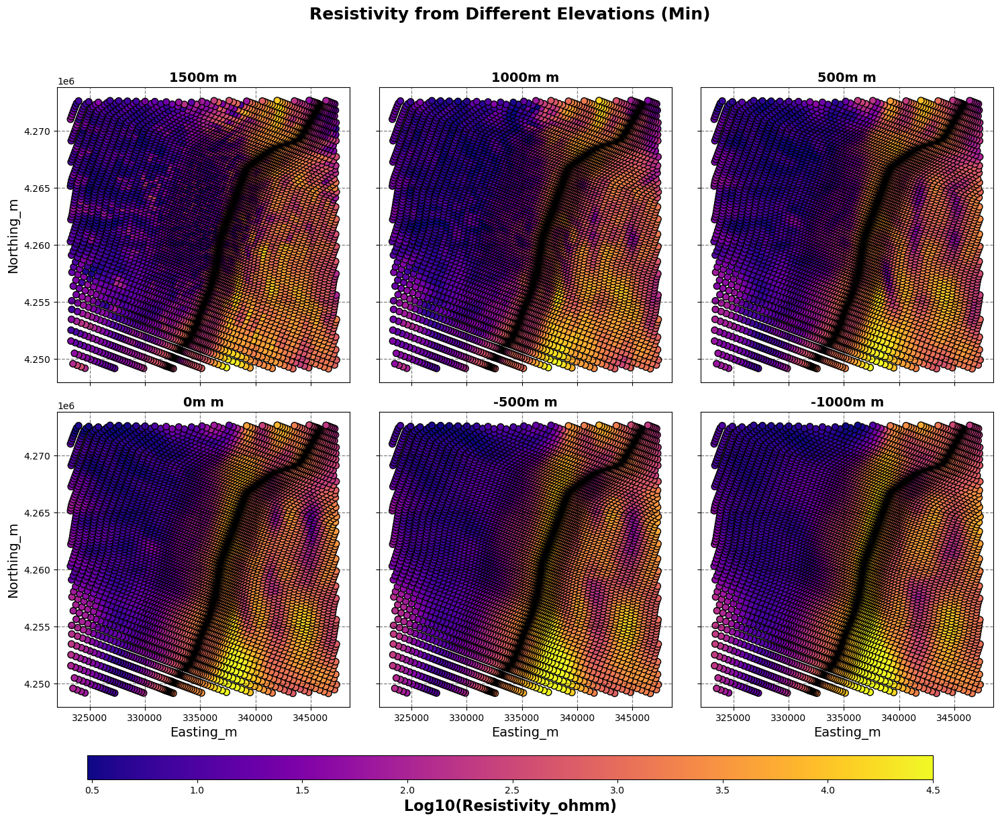

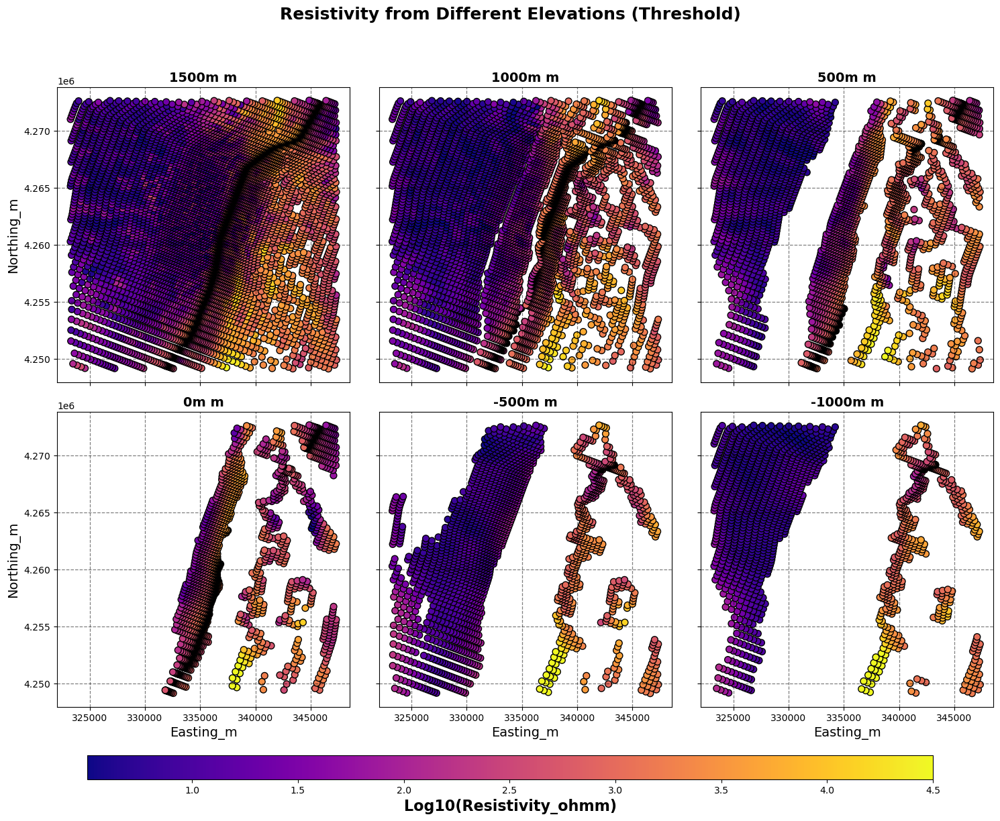

In [16]:
import matplotlib.pyplot as plt
import numpy as np

def plot_resistivity_subplots(dataframes, title, label_prefix, font_size=12, cmap_choice="viridis", 
                              subplot_spacing=0.3, grid_color="gray", grid_alpha=0.3):
    """
    Plota múltiplos DataFrames contendo dados de resistividade em diferentes elevações como subplots.
    Os valores de resistividade são convertidos para log10 de forma segura para evitar problemas com valores negativos e zero.

    Args:
    - dataframes (dict): Dicionário de DataFrames, onde as chaves são os nomes dos DataFrames e os valores são os DataFrames em si.
    - title (str): Título principal do gráfico.
    - label_prefix (str): Prefixo para os nomes dos DataFrames (ex: "df_modulo_min" ou "df_modulo_threshold").
    - font_size (int): Tamanho da fonte para rótulos e títulos.
    - cmap_choice (str): Nome do colormap a ser usado.
    - subplot_spacing (float): Espaçamento entre os subplots.
    - grid_color (str): Cor do grid nos subplots.
    - grid_alpha (float): Transparência do grid nos subplots.

    Returns:
    - Exibe um gráfico com subplots representando os diferentes DataFrames.
    """

    # Definir a ordem correta das elevações para os subplots
    elevations = ["1500m", "1000m", "500m", "0m", "minus500m", "minus1000m"]
    
    # Criar a figura com 2 linhas e 3 colunas para os subplots
    fig, axes = plt.subplots(2, 3, figsize=(18, 12), sharex=True, sharey=True)
    fig.suptitle(title, fontsize=font_size + 4, fontweight='bold')

    # Determinar limites globais para os eixos
    all_x = np.concatenate([df["Easting_m"].values for df in dataframes.values()])
    all_y = np.concatenate([df["Northing_m"].values for df in dataframes.values()])
    all_resistivity = np.concatenate([df["Resistivity_ohmm"].values for df in dataframes.values()])

    x_min, x_max = all_x.min(), all_x.max()
    y_min, y_max = all_y.min(), all_y.max()

    # Ajustar valores de resistividade para log10 de forma segura (evita problemas com valores negativos e zero)
    shift_value = abs(all_resistivity.min()) + 1  # Para garantir que os valores sejam positivos

    # Criar os subplots para cada DataFrame
    for i, (ax, elev) in enumerate(zip(axes.flatten(), elevations)):
        df_name = f"{label_prefix}_{elev}"  # Ajusta o nome dos DataFrames (ex: "df_modulo_min_1000m")
        if df_name in dataframes:  # Verifica se o DataFrame existe
            df = dataframes[df_name]
            
            # Transformação log segura para a resistividade
            df["Resistivity_ohmm_log"] = np.log10(df["Resistivity_ohmm"] + shift_value)
            
            sc = ax.scatter(df["Easting_m"], df["Northing_m"], c=df["Resistivity_ohmm_log"], 
                            cmap=cmap_choice, s=50, edgecolor="black")
            ax.set_title(f"{elev.replace('minus', '-')} m", fontsize=font_size, fontweight='bold')

            # Aplicar grid nos subplots
            ax.grid(True, linestyle="--", linewidth=0.9, color=grid_color, alpha=grid_alpha)

            # Definir rótulos dos eixos apenas onde necessário
            if i % 3 == 0:  # Primeira coluna
                ax.set_ylabel("Northing_m", fontsize=font_size)
            if i >= 3:  # Última linha (índices 3, 4, 5)
                ax.set_xlabel("Easting_m", fontsize=font_size)

    # Adicionar uma barra de cores única abaixo de todos os subplots
    cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.03])
    cbar = plt.colorbar(sc, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Log10(Resistivity_ohmm)", fontsize=font_size + 2, fontweight='bold')

    plt.subplots_adjust(hspace=subplot_spacing, wspace=subplot_spacing)  # Ajustar espaçamento dos subplots
    plt.show()


# **✅ Função para Plotar os DataFrames `df_modulo_min`**
def plot_resistivity_subplots_min():
    dataframes_dict = {
        "df_modulo_min_1500m": df_modulo_min_1500m,
        "df_modulo_min_1000m": df_modulo_min_1000m,
        "df_modulo_min_500m": df_modulo_min_500m,
        "df_modulo_min_0m": df_modulo_min_0m,
        "df_modulo_min_minus500m": df_modulo_min_minus500m,
        "df_modulo_min_minus1000m": df_modulo_min_minus1000m,
    }
    plot_resistivity_subplots(dataframes_dict, title="Resistivity from Different Elevations (Min)", label_prefix="df_modulo_min",
                              font_size=14, cmap_choice="plasma", subplot_spacing=0.1, grid_color="black", grid_alpha=0.5)


# **✅ Função para Plotar os DataFrames `df_modulo_threshold`**
def plot_resistivity_subplots_threshold():
    dataframes_dict = {
        "df_modulo_threshold_1500m": df_modulo_threshold_1500m,
        "df_modulo_threshold_1000m": df_modulo_threshold_1000m,
        "df_modulo_threshold_500m": df_modulo_threshold_500m,
        "df_modulo_threshold_0m": df_modulo_threshold_0m,
        "df_modulo_threshold_minus500m": df_modulo_threshold_minus500m,
        "df_modulo_threshold_minus1000m": df_modulo_threshold_minus1000m,
    }
    plot_resistivity_subplots(dataframes_dict, title="Resistivity from Different Elevations (Threshold)", label_prefix="df_modulo_threshold",
                              font_size=14, cmap_choice="plasma", subplot_spacing=0.1, grid_color="black", grid_alpha=0.5)


# **✅ Executar as duas visualizações separadamente**
plot_resistivity_subplots_min()  # Plot dos DataFrames df_modulo_min
plot_resistivity_subplots_threshold()  # Plot dos DataFrames df_modulo_threshold


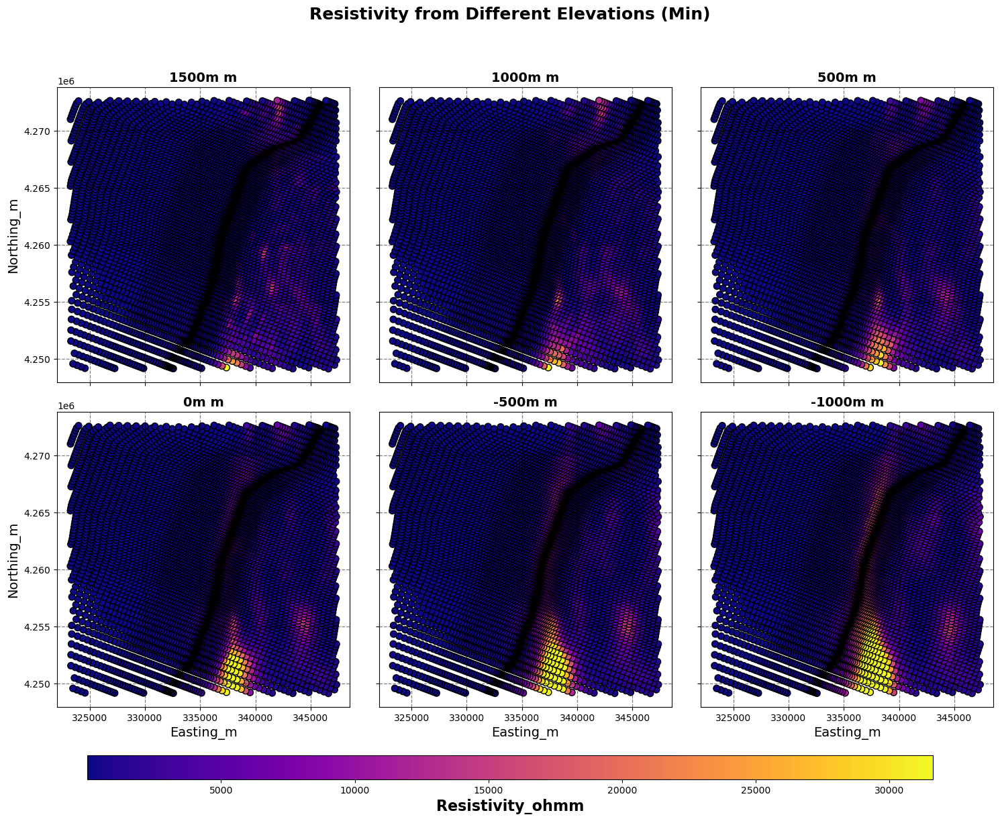

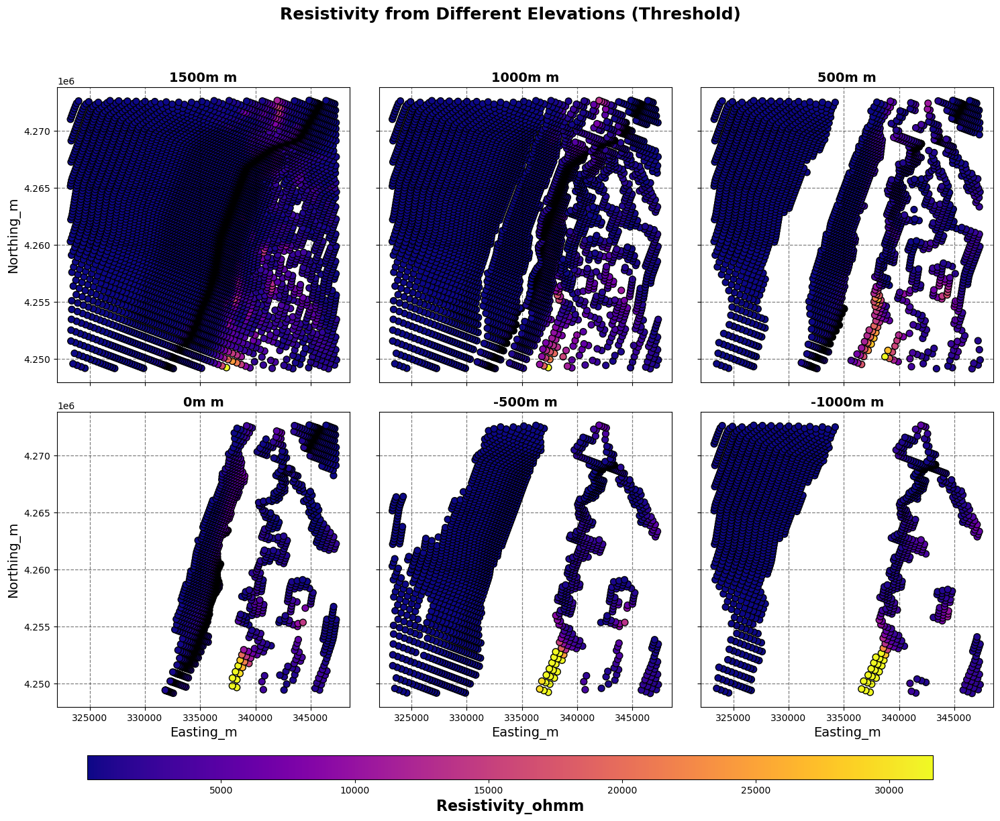

In [17]:
import matplotlib.pyplot as plt
import numpy as np

def plot_resistivity_subplots(dataframes, title, label_prefix, font_size=12, cmap_choice="viridis", 
                              subplot_spacing=0.3, grid_color="gray", grid_alpha=0.3):
    """
    Plota múltiplos DataFrames contendo dados de resistividade em diferentes elevações como subplots.

    Args:
    - dataframes (dict): Dicionário de DataFrames, onde as chaves são os nomes dos DataFrames e os valores são os DataFrames em si.
    - title (str): Título principal do gráfico.
    - label_prefix (str): Prefixo para os nomes dos DataFrames (ex: "df_modulo_min" ou "df_modulo_threshold").
    - font_size (int): Tamanho da fonte para rótulos e títulos.
    - cmap_choice (str): Nome do colormap a ser usado.
    - subplot_spacing (float): Espaçamento entre os subplots.
    - grid_color (str): Cor do grid nos subplots.
    - grid_alpha (float): Transparência do grid nos subplots.

    Returns:
    - Exibe um gráfico com subplots representando os diferentes DataFrames.
    """

    # Definir a ordem correta das elevações para os subplots
    elevations = ["1500m", "1000m", "500m", "0m", "minus500m", "minus1000m"]
    
    # Criar a figura com 2 linhas e 3 colunas para os subplots
    fig, axes = plt.subplots(2, 3, figsize=(18, 12), sharex=True, sharey=True)
    fig.suptitle(title, fontsize=font_size + 4, fontweight='bold')

    # Determinar limites globais para os eixos
    all_x = np.concatenate([df["Easting_m"].values for df in dataframes.values()])
    all_y = np.concatenate([df["Northing_m"].values for df in dataframes.values()])
    all_resistivity = np.concatenate([df["Resistivity_ohmm"].values for df in dataframes.values()])

    x_min, x_max = all_x.min(), all_x.max()
    y_min, y_max = all_y.min(), all_y.max()

    # Criar os subplots para cada DataFrame
    for i, (ax, elev) in enumerate(zip(axes.flatten(), elevations)):
        df_name = f"{label_prefix}_{elev}"  # Ajusta o nome dos DataFrames (ex: "df_modulo_min_1000m")
        if df_name in dataframes:  # Verifica se o DataFrame existe
            df = dataframes[df_name]
            
            sc = ax.scatter(df["Easting_m"], df["Northing_m"], c=df["Resistivity_ohmm"], 
                            cmap=cmap_choice, s=50, edgecolor="black")  # Sem normalização!
            ax.set_title(f"{elev.replace('minus', '-')} m", fontsize=font_size, fontweight='bold')

            # Aplicar grid nos subplots
            ax.grid(True, linestyle="--", linewidth=0.9, color=grid_color, alpha=grid_alpha)

            # Definir rótulos dos eixos apenas onde necessário
            if i % 3 == 0:  # Primeira coluna
                ax.set_ylabel("Northing_m", fontsize=font_size)
            if i >= 3:  # Última linha (índices 3, 4, 5)
                ax.set_xlabel("Easting_m", fontsize=font_size)

    # Adicionar uma barra de cores única abaixo de todos os subplots (sem normalização!)
    cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.03])
    cbar = plt.colorbar(sc, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Resistivity_ohmm", fontsize=font_size + 2, fontweight='bold')

    plt.subplots_adjust(hspace=subplot_spacing, wspace=subplot_spacing)  # Ajustar espaçamento dos subplots
    plt.show()


# **✅ Função para Plotar os DataFrames `df_modulo_min`**
def plot_resistivity_subplots_min():
    dataframes_dict = {
        "df_modulo_min_1500m": df_modulo_min_1500m,
        "df_modulo_min_1000m": df_modulo_min_1000m,
        "df_modulo_min_500m": df_modulo_min_500m,
        "df_modulo_min_0m": df_modulo_min_0m,
        "df_modulo_min_minus500m": df_modulo_min_minus500m,
        "df_modulo_min_minus1000m": df_modulo_min_minus1000m,
    }
    plot_resistivity_subplots(dataframes_dict, title="Resistivity from Different Elevations (Min)", label_prefix="df_modulo_min",
                              font_size=14, cmap_choice="plasma", subplot_spacing=0.1, grid_color="black", grid_alpha=0.5)


# **✅ Função para Plotar os DataFrames `df_modulo_threshold`**
def plot_resistivity_subplots_threshold():
    dataframes_dict = {
        "df_modulo_threshold_1500m": df_modulo_threshold_1500m,
        "df_modulo_threshold_1000m": df_modulo_threshold_1000m,
        "df_modulo_threshold_500m": df_modulo_threshold_500m,
        "df_modulo_threshold_0m": df_modulo_threshold_0m,
        "df_modulo_threshold_minus500m": df_modulo_threshold_minus500m,
        "df_modulo_threshold_minus1000m": df_modulo_threshold_minus1000m,
    }
    plot_resistivity_subplots(dataframes_dict, title="Resistivity from Different Elevations (Threshold)", label_prefix="df_modulo_threshold",
                              font_size=14, cmap_choice="plasma", subplot_spacing=0.1, grid_color="black", grid_alpha=0.5)


# **✅ Executar as duas visualizações separadamente**
plot_resistivity_subplots_min()  # Plot dos DataFrames df_modulo_min
plot_resistivity_subplots_threshold()  # Plot dos DataFrames df_modulo_threshold


In [11]:
print(df_modulo_min_1500m)

      Northing_m  Easting_m  Elevation_m  Resistivity_ohmm
0      4249156.0   346606.2     1515.184            657.68
1      4249161.0   343387.9     1460.185            410.15
2      4249168.0   332567.2     1493.840            146.04
3      4249183.0   327262.2     1504.813              6.73
4      4249190.0   329875.3     1496.374             75.99
...          ...        ...          ...               ...
6893   4272637.0   326843.8     1475.804              2.11
6894   4272638.0   346396.6     1491.725             37.64
6895   4272640.0   337626.0     1508.573            189.45
6896   4272650.0   341978.9     1546.497           5461.41
6897   4272661.0   344872.0     1486.794             21.42

[6898 rows x 4 columns]


In [19]:
df_modulo_min.describe()

,Northing_m,Easting_m,Elevation_m,Resistivity_ohmm
count,6.898000e+03,6898.000000,6898.000000,6898.000000
mean,4.262039e+06,336607.730125,23.274649,1402.762507
std,5.967326e+03,5678.492522,92.432191,2760.441686
min,4.249156e+06,323258.700000,-210.925400,0.100000
25%,4.257502e+06,332945.050000,-50.743330,18.662500
50%,4.262380e+06,336798.350000,46.355735,509.785000
75%,4.267010e+06,340605.400000,92.180600,1671.587500
max,4.272661e+06,347335.500000,214.439600,31622.780000


In [20]:
df_modulo_threshold.describe()

,Northing_m,Easting_m,Elevation_m,Resistivity_ohmm
count,1.810000e+03,1810.000000,1810.000000,1810.000000
mean,4.260762e+06,338418.549392,6.335159,1588.992923
std,6.351635e+03,4238.549402,29.202320,2671.720909
min,4.249168e+06,331839.300000,-49.950450,7.290000
25%,4.255844e+06,335283.400000,-17.627865,374.910000
50%,4.259586e+06,336539.700000,8.334812,871.950000
75%,4.265978e+06,341982.050000,33.268770,1814.457500
max,4.272661e+06,347312.700000,49.929750,31622.780000


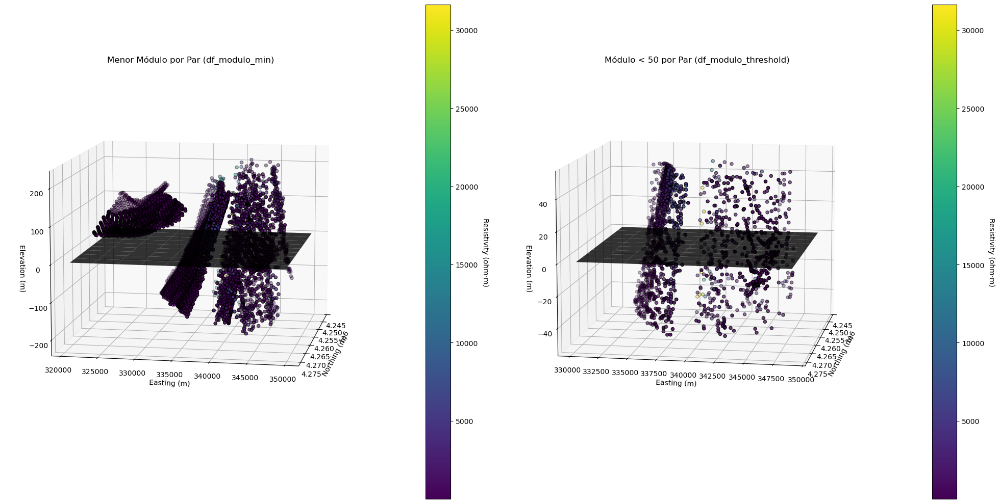

In [14]:
import matplotlib.pyplot as plt
import numpy as np

# ---------------------------
# Função para Plotar o DataFrame
# ---------------------------
def plot_dataframe(data, title, ax, elevation_angle=90, azimuth_angle=180, color_map='viridis'):
    # Extrair coordenadas e resistividade
    northing = data['Northing_m'].values
    easting = data['Easting_m'].values
    elevation = data['Elevation_m'].values
    resistivity = data['Resistivity_ohmm'].values

    # Adicionar os pontos da nuvem de dados
    scatter = ax.scatter(
        northing, easting, elevation, c=resistivity, cmap=color_map, s=20, edgecolor='k'
    )

    # Adicionar o plano em Elevation_m = 0
    extrapolation_factor = 0.1  # 10% de extrapolação
    northing_min = northing.min() - (northing.max() - northing.min()) * extrapolation_factor
    northing_max = northing.max() + (northing.max() - northing.min()) * extrapolation_factor
    easting_min = easting.min() - (easting.max() - easting.min()) * extrapolation_factor
    easting_max = easting.max() + (easting.max() - easting.min()) * extrapolation_factor

    northing_range = np.linspace(northing_min, northing_max, 10)
    easting_range = np.linspace(easting_min, easting_max, 10)
    northing_grid, easting_grid = np.meshgrid(northing_range, easting_range)
    elevation_grid = np.zeros_like(northing_grid)  # Elevation_m = 0 para todo o plano
    ax.plot_surface(northing_grid, easting_grid, elevation_grid, color='black', alpha=0.8)

    # Configurar os rótulos dos eixos
    ax.set_xlabel('Northing (m)')
    ax.set_ylabel('Easting (m)')
    ax.set_zlabel('Elevation (m)')
    ax.set_title(title)

    # Adicionar barra de cores
    cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
    cbar.set_label('Resistivity (ohm·m)', rotation=270, labelpad=15)

    # Configurar o ângulo de visualização
    ax.view_init(elev=elevation_angle, azim=azimuth_angle)

    return ax

# ---------------------------
# 1. Criar as Figuras
# ---------------------------
fig = plt.figure(figsize=(20, 10))

# Configurações do Ângulo de Visualização
elevation_angle = 10  # Ângulo de elevação (em graus)
azimuth_angle = 10   # Ângulo azimutal (em graus)

# Plot para o DataFrame com menor módulo (df_modulo_min)
ax1 = fig.add_subplot(121, projection='3d')
plot_dataframe(
    df_modulo_min, "Menor Módulo por Par (df_modulo_min)", ax1,
    elevation_angle=elevation_angle, azimuth_angle=azimuth_angle
)

# Plot para o DataFrame com módulo menor que 50 (df_modulo_threshold)
ax2 = fig.add_subplot(122, projection='3d')
plot_dataframe(
    df_modulo_threshold, "Módulo < 50 por Par (df_modulo_threshold)", ax2,
    elevation_angle=elevation_angle, azimuth_angle=azimuth_angle
)

# ---------------------------
# 2. Mostrar os Gráficos
# ---------------------------
plt.tight_layout()
plt.show()


In [29]:
import pyvista as pv
import numpy as np

# ---------------------------
# Função para Criar o Plot
# ---------------------------
def plot_with_pyvista(data, title):
    # Criar uma plotagem do PyVista
    plotter = pv.Plotter()
    
    # Extrair coordenadas e resistividade
    northing = data['Northing_m'].values
    easting = data['Easting_m'].values
    elevation = data['Elevation_m'].values
    resistivity = data['Resistivity_ohmm'].values

    # Criar uma nuvem de pontos
    points = np.column_stack((northing, easting, elevation))
    cloud = pv.PolyData(points)
    cloud['Resistivity'] = resistivity

    # Adicionar a nuvem de pontos ao plotter
    plotter.add_mesh(cloud, point_size=5, render_points_as_spheres=True, scalars='Resistivity', cmap='viridis')

    # Adicionar o plano em Elevation_m = 0
    northing_min, northing_max = northing.min(), northing.max()
    easting_min, easting_max = easting.min(), easting.max()
    plane = pv.Plane(
        center=(northing.mean(), easting.mean(), 0),
        direction=(0, 0, 1),
        i_size=northing_max - northing_min,
        j_size=easting_max - easting_min
    )
    plotter.add_mesh(plane, color='black', opacity=0.8)

    # Configurar a câmera
    plotter.view_vector((0, 0, 1), viewup=(1, 0, 0))

    # Títulos e rótulos
    plotter.add_text(title, font_size=10)
    plotter.show_axes()

    # Mostrar a barra de cores
    plotter.add_scalar_bar(title='Resistivity (ohm·m)', vertical=True)

    # Renderizar
    plotter.show()

# ---------------------------
# 1. Plot para o DataFrame com Menor Módulo (df_modulo_min)
# ---------------------------
plot_with_pyvista(df_modulo_min, "Menor Módulo por Par (df_modulo_min)")

# ---------------------------
# 2. Plot para o DataFrame com Módulo < 50 (df_modulo_threshold)
# ---------------------------
plot_with_pyvista(df_modulo_threshold, "Módulo < 50 por Par (df_modulo_threshold)")


Widget(value='<iframe src="http://localhost:34541/index.html?ui=P_0x7b6c4f016e60_4&reconnect=auto" class="pyvi…

Widget(value='<iframe src="http://localhost:34541/index.html?ui=P_0x7b6c4f015fc0_5&reconnect=auto" class="pyvi…